<a href="https://colab.research.google.com/github/SisekoC/My-Notebooks/blob/main/py_algotrading_combo_ma_crossover_grid_search_take2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Algorithmic Trading Model for Combo Moving Average Crossover Grid Search Take 2
### David Lowe
### August 6, 2020

NOTE: This script is for learning purposes only and does not constitute a recommendation for buying or selling any stock mentioned in this script.

SUMMARY: The purpose of this project is to construct and test an algorithmic trading model and document the end-to-end steps using a template.

INTRODUCTION: This algorithmic trading model examines a series of exponential and simple moving average (MA) crossover models via a grid search methodology. This iteration of the modeling will focus on applying a trend-following or a momentum-oriented approach. When the fast moving-average curve crosses above the slow moving-average curve, the strategy goes long (buys) on the stock. When the opposite occurs, we will exit the position.

From iteration Take1, the grid search script searched through all combinations between the two sets of MA curves, simple and exponential. The faster MA curve ranged from 5 days to 30 days, while the slower MA ranged from 10 days to 60 days. Both curves used a 5-day increment.

For this Take2 iteration, the grid search script will search through all combinations between the four sets of MA curves. The four models are simple only, exponential only, fast simple/slow exponential, and fast exponential/slow simple. The fast MA curve can range from 5 days to 30 days, while the slower MA can range from 10 days to 60 days. Both curves use a 5-day increment.

ANALYSIS: From iteration Take1, we analyzed the stock prices for Apple Inc. (AAPL) between January 1, 2019 and August 3, 2020. The best simple MA model with 10-day and 20-day produced a profit of 284.11 per share. The best exponential MA model with 5-day and 20-day produced a gain of 280.73. The long-only approach yielded a gain of 280.86 per share.

For this Take2 iteration, we analyzed the stock prices for Apple Inc. (AAPL) between January 1, 2019 and August 3, 2020. The best MA model with 5-day EMA and 30-day SMA produced a profit of 289.28 per share. The long-only approach yielded a profit of 280.86 per share.

CONCLUSION: For this dataset, the combination of an exponential moving average curve of five days with a simple moving average curve of 30 days seem to produce the best profit level.

Dataset ML Model: Time series analysis with numerical attributes

Dataset Used: Quandl

An algorithmic trading modeling project generally can be broken down into about five major tasks:

1. Prepare Environment
2. Acquire and Pre-Process Data
3. Develop Strategy and Train Model
4. Back-test Model
5. Evaluate Performance

## Task 1. Prepare Environment

In [ ]:
pip install python-dotenv

In [ ]:
import os
import sys
import numpy as np
import pandas as pd
import requests
import json
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from dotenv import load_dotenv

In [ ]:
stock_symbol = 'AAPL'
initial_capital = 10000

# Specify the moving average parameters for the trading strategy
fast_ema_min = 5
fast_ema_max = 30
slow_ema_min = 10
slow_ema_max = 60
fast_sma_min = 5
fast_sma_max = 30
slow_sma_min = 10
slow_sma_max = 60
ma_increment = 5
min_ma_gap = 5

# The number of extra days of data we need (usually equals to the larger of slow_ema or slow_sma)
extra_days_data = slow_sma_max

model_start_date = datetime(2015, 1, 1)
print("Starting date for the model:", model_start_date)
stock_start_date = model_start_date - timedelta(days=int(extra_days_data*1.5)) # Need more pricing data to calculate moving averages

model_end_date = datetime.now()
model_end_date = datetime(2020, 8, 3)
print("Ending date for the model:", model_end_date)

Starting date for the model: 2015-01-01 00:00:00
Ending date for the model: 2020-08-03 00:00:00


In [ ]:
# Begin the timer for the script processing
startTimeScript = datetime.now()

# Set up the verbose flag to print detailed messages for debugging (setting True will activate!)
verbose_models = True
verbose_graphs = True
verbose_portfolios = True

# Set up the sendNotification flag to send progress emails (setting True will send emails!)
notifyStatus = True

# Set up the parent directory location for loading the dotenv files
useColab = True
if useColab:
    # Mount Google Drive locally for storing files
    from google.colab import drive
    drive.mount('/content/gdrive')
    gdrivePrefix = '/content/gdrive/My Drive/Colab_Downloads/'
    env_path = '/content/gdrive/My Drive/Colab Notebooks/'
    dotenv_path = env_path + "python_script.env"
    load_dotenv(dotenv_path=dotenv_path)

# Set up the dotenv file for retrieving environment variables
useLocalPC = False
if useLocalPC:
    env_path = "/Users/david/PycharmProjects/"
    dotenv_path = env_path + "python_script.env"
    load_dotenv(dotenv_path=dotenv_path)

# Configure the plotting style
plt.style.use('seaborn')

# Set Pandas options
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 140)

Mounted at /content/gdrive


<ipython-input-4-f40fc0c96f94>:31: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


## Task 2. Acquire and Pre-Process Data

In [ ]:
pip install quandl

In [ ]:
# Check and see whether the API key is available
import quandl
quandl.ApiConfig.api_key = 'AywUrfKTvTTsCiRfWoWp'
quandl_key = quandl.ApiConfig.api_key
if quandl_key is None: sys.exit("API key for Quandl not available. Script Processing Aborted!!!")

In [ ]:
start_date_string = stock_start_date.strftime('%Y-%m-%d')
end_date_string = model_end_date.strftime('%Y-%m-%d')

quandl_url = "https://www.quandl.com/api/v3/datatables/SHARADAR/SEP.json?date.gte=%s&date.lte=%s&ticker=%s&api_key=%s" % (start_date_string, end_date_string, stock_symbol, quandl_key)

In [ ]:
import requests
import pandas as pd

# Make the API call
response = requests.get(quandl_url)

# Check if the request was successful
if response.status_code == 200:
    # Parse the JSON response
    quandl_dict = response.json()

    # Check if the expected keys are in the response
    if 'datatable' in quandl_dict and 'data' in quandl_dict['datatable']:
        # Convert to DataFrame
        stock_quandl = pd.DataFrame(quandl_dict['datatable']['data'])
        print(len(stock_quandl), 'data points retrieved from the API call.')
    else:
        print("Error: Unexpected response format.")
else:
    print(f"Error: Failed to retrieve data. Status code: {response.status_code}")

82 data points retrieved from the API call.


In [ ]:
# Rename columns
stock_quandl.columns = ['ticker', 'date', 'open', 'high', 'low', 'close', 'volume', 'dividend', 'closeunadj', 'lastupdated']

# Set the index to the 'date' column and convert it to datetime
stock_quandl.set_index(pd.to_datetime(stock_quandl['date']), inplace=True)

# Sort the DataFrame by the index
stock_quandl.sort_index(ascending=True, inplace=True)

# Display DataFrame information
stock_quandl.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 82 entries, 2018-09-04 to 2018-12-31
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ticker       82 non-null     object 
 1   date         82 non-null     object 
 2   open         82 non-null     float64
 3   high         82 non-null     float64
 4   low          82 non-null     float64
 5   close        82 non-null     float64
 6   volume       82 non-null     float64
 7   dividend     82 non-null     float64
 8   closeunadj   82 non-null     float64
 9   lastupdated  82 non-null     object 
dtypes: float64(7), object(3)
memory usage: 7.0+ KB


In [ ]:
stock_quandl.head()

,ticker,date,open,high,low,close,volume,dividend,closeunadj,lastupdated
date,,,,,,,,,,
2018-09-04,AAPL,2018-09-04,57.102,57.295,56.657,57.090,109560528.0,54.397,228.36,2024-08-12
2018-09-05,AAPL,2018-09-05,57.248,57.417,56.275,56.718,133331840.0,54.042,226.87,2024-08-12
2018-09-06,AAPL,2018-09-06,56.557,56.837,55.325,55.775,137159904.0,53.144,223.10,2024-08-12
2018-09-07,AAPL,2018-09-07,55.462,56.343,55.178,55.325,150479240.0,52.715,221.30,2024-08-12
2018-09-10,AAPL,2018-09-10,55.237,55.462,54.117,54.583,158065812.0,52.007,218.33,2024-08-12


In [ ]:
stock_quandl.tail()

,ticker,date,open,high,low,close,volume,dividend,closeunadj,lastupdated
date,,,,,,,,,,
2018-12-24,AAPL,2018-12-24,37.038,37.888,36.648,36.708,148676928.0,35.098,146.83,2024-08-12
2018-12-26,AAPL,2018-12-26,37.075,39.307,36.680,39.292,234330176.0,37.570,157.17,2024-08-12
2018-12-27,AAPL,2018-12-27,38.960,39.193,37.517,39.038,212468260.0,37.326,156.15,2024-08-12
2018-12-28,AAPL,2018-12-28,39.375,39.630,38.638,39.057,169165696.0,37.345,156.23,2024-08-12
2018-12-31,AAPL,2018-12-31,39.633,39.840,39.120,39.435,140013864.0,37.706,157.74,2024-08-12


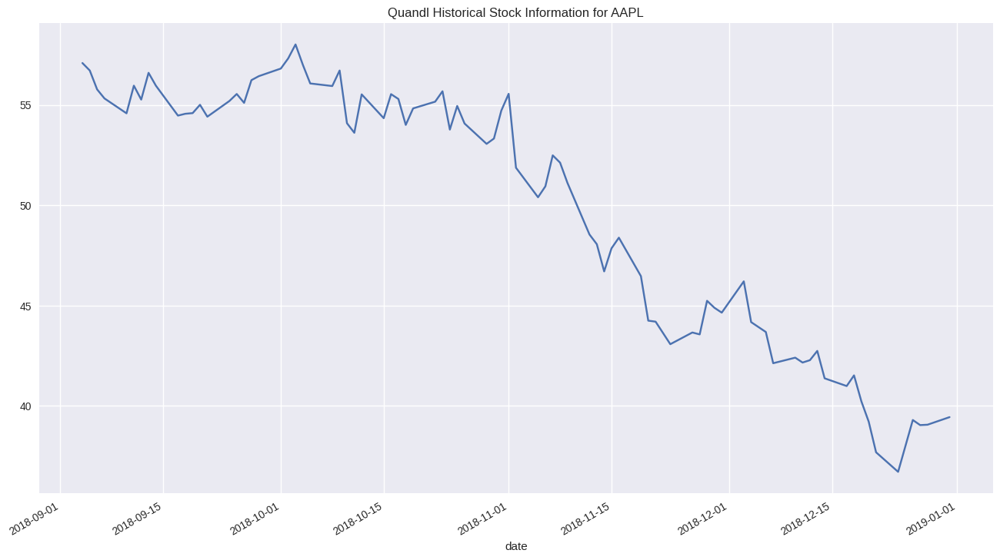

In [ ]:
quandl_title = 'Quandl Historical Stock Information for ' + stock_symbol
stock_quandl['close'].plot(figsize=(16,9), title=quandl_title)
plt.show()

## Task 3. Develop Strategy and Train Model

### 3.a) Set up the Dataframe for the Trading Model

In [ ]:
import pandas as pd

# Assuming stock_quandl is already defined and contains 'open' and 'close' columns
model_template = stock_quandl.loc[:, ['open', 'close']]

# Rename columns
model_template.rename(columns={'open': 'open_price', 'close': 'close_price'}, inplace=True)

# Display DataFrame information
model_template.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 82 entries, 2018-09-04 to 2018-12-31
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   open_price   82 non-null     float64
 1   close_price  82 non-null     float64
dtypes: float64(2)
memory usage: 1.9 KB


### 3.b) Set up the Analysis Table with Indicators

In [ ]:
import numpy as np
import pandas as pd

def populate_indicators(passed_model, fast_ma, slow_ma):
    passed_model['fast_ema'] = passed_model['close_price'].ewm(span=fast_ma).mean()
    passed_model['slow_ema'] = passed_model['close_price'].ewm(span=slow_ma).mean()
    passed_model['fast_sma'] = passed_model['close_price'].rolling(window=fast_ma).mean()
    passed_model['slow_sma'] = passed_model['close_price'].rolling(window=slow_ma).mean()
    passed_model['ema_change'] = passed_model['fast_ema'] - passed_model['slow_ema']
    passed_model['sma_change'] = passed_model['fast_sma'] - passed_model['slow_sma']
    passed_model['fastema_slowsma_chg'] = passed_model['fast_ema'] - passed_model['slow_sma']
    passed_model['fastsma_slowema_chg'] = passed_model['fast_sma'] - passed_model['slow_ema']
    passed_model['trade_signal'] = np.zeros(len(passed_model))
    passed_model['signal_change'] = np.zeros(len(passed_model))
    passed_model['entry_exit'] = np.zeros(len(passed_model))

    return passed_model

def populate_signals(model, change_curve):
    wait_for_entry = True
    for x in range(len(model)):
        if model[change_curve].iloc[x] > 0:
            model.at[x, 'trade_signal'] = 1  # Enter long position
        else:
            model.at[x, 'trade_signal'] = 0  # Exit long position

        if x != 0:
            model.at[x, 'signal_change'] = model['trade_signal'].iloc[x] - model['trade_signal'].iloc[x - 1]

            if wait_for_entry and model['signal_change'].iloc[x] == 1:
                model.at[x, 'entry_exit'] = model['signal_change'].iloc[x]
                wait_for_entry = False
            elif not wait_for_entry and model['signal_change'].iloc[x] != 0:
                model.at[x, 'entry_exit'] = model['signal_change'].iloc[x]

    return model


In [ ]:
# Processing models using only the EMA curves
ema_model_collection = {}
serial_number = 1

for slow_ma in range(slow_ema_min, slow_ema_max + 1, ma_increment):
    for fast_ma in range(fast_ema_min, fast_ema_max + 1, ma_increment):
        if (slow_ma - fast_ma) < min_ma_gap:
            break
        if verbose_models:
            print(f'Processing model with fast_ema of {fast_ma} and slow_ema of {slow_ma}')

        model_tag = f'EMA_{str(serial_number).zfill(3)}_FastEMA_{str(fast_ma).zfill(3)}_SlowEMA_{str(slow_ma).zfill(3)}'
        serial_number += 1

        trading_model = model_template.copy()
        populate_indicators(trading_model, fast_ma, slow_ma)
        trading_model = trading_model[model_start_date:model_end_date]
        populate_signals(trading_model, 'ema_change')

        ema_model_collection[model_tag] = trading_model.copy()

        if verbose_models:
            print(f'Model {model_tag} added to the trading model collection.')

print(f'{len(ema_model_collection)} EMA only models generated!')

# Processing models using only the SMA curves
print()
sma_model_collection = {}
serial_number = 1

for slow_ma in range(slow_sma_min, slow_sma_max + 1, ma_increment):
    for fast_ma in range(fast_sma_min, fast_sma_max + 1, ma_increment):
        if (slow_ma - fast_ma) < min_ma_gap:
            break
        if verbose_models:
            print(f'Processing model with fast_sma of {fast_ma} and slow_sma of {slow_ma}')

        model_tag = f'SMA_{str(serial_number).zfill(3)}_FastSMA_{str(fast_ma).zfill(3)}_SlowSMA_{str(slow_ma).zfill(3)}'
        serial_number += 1

        trading_model = model_template.copy()
        populate_indicators(trading_model, fast_ma, slow_ma)
        trading_model = trading_model[model_start_date:model_end_date]
        populate_signals(trading_model, 'sma_change')

        sma_model_collection[model_tag] = trading_model.copy()

        if verbose_models:
            print(f'Model {model_tag} added to the trading model collection.')

print(f'{len(sma_model_collection)} SMA only models generated!')

# Processing models using fast EMA and slow SMA curves
print()
fast_ema_slow_sma_models = {}
serial_number = 1

for slow_ma in range(slow_sma_min, slow_sma_max + 1, ma_increment):
    for fast_ma in range(fast_ema_min, fast_ema_max + 1, ma_increment):
        if (slow_ma - fast_ma) < min_ma_gap:
            break
        if verbose_models:
            print('Processing model with fast_ema of', fast_ma, 'and slow_sma of', slow_ma)

        model_tag = f'Mixed_{str(serial_number).zfill(3)}_FastEMA_{str(fast_ma).zfill(3)}_SlowSMA_{str(slow_ma).zfill(3)}'
        serial_number += 1

        trading_model = model_template.copy()
        populate_indicators(trading_model, fast_ma, slow_ma)
        trading_model = trading_model[model_start_date:model_end_date]
        populate_signals(trading_model, 'fastema_slowsma_chg')

        fast_ema_slow_sma_models[model_tag] = trading_model.copy()

        if verbose_models:
            print('Model', model_tag, 'added to the trading model collection.')

print(len(fast_ema_slow_sma_models), 'Fast EMA/Slow SMA models generated!')

# Processing models using fast SMA and slow EMA curves
print()
fast_sma_slow_ema_models = {}
serial_number = 1

for slow_ma in range(slow_ema_min, slow_ema_max + 1, ma_increment):
    for fast_ma in range(fast_sma_min, fast_sma_max + 1, ma_increment):
        if (slow_ma - fast_ma) < min_ma_gap:
            break
        if verbose_models:
            print('Processing model with fast_sma of', fast_ma, 'and slow_ema of', slow_ma)

        model_tag = f'Mixed_{str(serial_number).zfill(3)}_FastSMA_{str(fast_ma).zfill(3)}_SlowEMA_{str(slow_ma).zfill(3)}'
        serial_number += 1

        trading_model = model_template.copy()
        populate_indicators(trading_model, fast_ma, slow_ma)
        trading_model = trading_model[model_start_date:model_end_date]
        populate_signals(trading_model, 'fastsma_slowema_chg')

        fast_sma_slow_ema_models[model_tag] = trading_model.copy()

        if verbose_models:
            print('Model', model_tag, 'added to the trading model collection.')

print(len(fast_sma_slow_ema_models), 'Fast SMA/Slow EMA models generated!')

Processing model with fast_ema of 5 and slow_ema of 10
Model EMA_001_FastEMA_005_SlowEMA_010 added to the trading model collection.
Processing model with fast_ema of 5 and slow_ema of 15
Model EMA_002_FastEMA_005_SlowEMA_015 added to the trading model collection.
Processing model with fast_ema of 10 and slow_ema of 15
Model EMA_003_FastEMA_010_SlowEMA_015 added to the trading model collection.
Processing model with fast_ema of 5 and slow_ema of 20
Model EMA_004_FastEMA_005_SlowEMA_020 added to the trading model collection.
Processing model with fast_ema of 10 and slow_ema of 20
Model EMA_005_FastEMA_010_SlowEMA_020 added to the trading model collection.
Processing model with fast_ema of 15 and slow_ema of 20
Model EMA_006_FastEMA_015_SlowEMA_020 added to the trading model collection.
Processing model with fast_ema of 5 and slow_ema of 25
Model EMA_007_FastEMA_005_SlowEMA_025 added to the trading model collection.
Processing model with fast_ema of 10 and slow_ema of 25
Model EMA_008_Fas

<ipython-input-15-502542d7421f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  model.at[x, 'trade_signal'] = 0  # Exit long position


Model EMA_040_FastEMA_005_SlowEMA_055 added to the trading model collection.
Processing model with fast_ema of 10 and slow_ema of 55
Model EMA_041_FastEMA_010_SlowEMA_055 added to the trading model collection.
Processing model with fast_ema of 15 and slow_ema of 55
Model EMA_042_FastEMA_015_SlowEMA_055 added to the trading model collection.
Processing model with fast_ema of 20 and slow_ema of 55
Model EMA_043_FastEMA_020_SlowEMA_055 added to the trading model collection.
Processing model with fast_ema of 25 and slow_ema of 55
Model EMA_044_FastEMA_025_SlowEMA_055 added to the trading model collection.
Processing model with fast_ema of 30 and slow_ema of 55
Model EMA_045_FastEMA_030_SlowEMA_055 added to the trading model collection.
Processing model with fast_ema of 5 and slow_ema of 60
Model EMA_046_FastEMA_005_SlowEMA_060 added to the trading model collection.
Processing model with fast_ema of 10 and slow_ema of 60
Model EMA_047_FastEMA_010_SlowEMA_060 added to the trading model colle

<ipython-input-15-502542d7421f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  model.at[x, 'trade_signal'] = 0  # Exit long position


Model SMA_005_FastSMA_010_SlowSMA_020 added to the trading model collection.
Processing model with fast_sma of 15 and slow_sma of 20
Model SMA_006_FastSMA_015_SlowSMA_020 added to the trading model collection.
Processing model with fast_sma of 5 and slow_sma of 25
Model SMA_007_FastSMA_005_SlowSMA_025 added to the trading model collection.
Processing model with fast_sma of 10 and slow_sma of 25
Model SMA_008_FastSMA_010_SlowSMA_025 added to the trading model collection.
Processing model with fast_sma of 15 and slow_sma of 25
Model SMA_009_FastSMA_015_SlowSMA_025 added to the trading model collection.
Processing model with fast_sma of 20 and slow_sma of 25
Model SMA_010_FastSMA_020_SlowSMA_025 added to the trading model collection.
Processing model with fast_sma of 5 and slow_sma of 30
Model SMA_011_FastSMA_005_SlowSMA_030 added to the trading model collection.
Processing model with fast_sma of 10 and slow_sma of 30
Model SMA_012_FastSMA_010_SlowSMA_030 added to the trading model collec

In [ ]:
def list_model_entry_exit(model_collection):
    for model_name, model_data in model_collection.items():
        print(f'Listing the signal change and entry/exit points for {model_name}')

        # Check if the required columns are present
        if 'signal_change' in model_data.columns and 'entry_exit' in model_data.columns:
            # Filter the DataFrame for signal changes and entry/exit points
            entry_exit_points = model_data[(model_data['signal_change'] != 0) | (model_data['entry_exit'] != 0)]

            # Check if the filtered DataFrame is not empty
            if not entry_exit_points.empty:
                print(entry_exit_points[['signal_change', 'entry_exit']])
            else:
                print('No entry/exit points found.')
        else:
            print(f'Error: Required columns not found in {model_name}')

        print()

# Example usage
# list_model_entry_exit(ema_model_collection)

In [ ]:
if verbose_models: list_model_entry_exit(ema_model_collection)

Listing the signal change and entry/exit points for EMA_001_FastEMA_005_SlowEMA_010
      signal_change  entry_exit
date                           
0               NaN         NaN
1               0.0         NaN
2               0.0         NaN
3               0.0         NaN
4               0.0         NaN
5               0.0         NaN
6               0.0         NaN
7               0.0         NaN
8               0.0         NaN
9               0.0         NaN
10              0.0         NaN
11              0.0         NaN
12              0.0         NaN
13              0.0         NaN
14              0.0         NaN
15              0.0         NaN
16              0.0         NaN
17              0.0         NaN
18              0.0         NaN
19              0.0         NaN
20              0.0         NaN
21              0.0         NaN
22              0.0         NaN
23              0.0         NaN
24              0.0         NaN
25              0.0         NaN
26              0.0 

In [ ]:
if verbose_models: list_model_entry_exit(sma_model_collection)

Listing the signal change and entry/exit points for SMA_001_FastSMA_005_SlowSMA_010
      signal_change  entry_exit
date                           
0               NaN         NaN
1               0.0         NaN
2               0.0         NaN
3               0.0         NaN
4               0.0         NaN
5               0.0         NaN
6               0.0         NaN
7               0.0         NaN
8               0.0         NaN
9               0.0         NaN
10              0.0         NaN
11              0.0         NaN
12              0.0         NaN
13              0.0         NaN
14              0.0         NaN
15              0.0         NaN
16              0.0         NaN
17              0.0         NaN
18              0.0         NaN
19              0.0         NaN
20              0.0         NaN
21              0.0         NaN
22              0.0         NaN
23              0.0         NaN
24              0.0         NaN
25              0.0         NaN
26              0.0 

In [ ]:
if verbose_models: list_model_entry_exit(fast_ema_slow_sma_models)

Listing the signal change and entry/exit points for Mixed_001_FastEMA_005_SlowSMA_010
      signal_change  entry_exit
date                           
0               NaN         NaN
1               0.0         NaN
2               0.0         NaN
3               0.0         NaN
4               0.0         NaN
5               0.0         NaN
6               0.0         NaN
7               0.0         NaN
8               0.0         NaN
9               0.0         NaN
10              0.0         NaN
11              0.0         NaN
12              0.0         NaN
13              0.0         NaN
14              0.0         NaN
15              0.0         NaN
16              0.0         NaN
17              0.0         NaN
18              0.0         NaN
19              0.0         NaN
20              0.0         NaN
21              0.0         NaN
22              0.0         NaN
23              0.0         NaN
24              0.0         NaN
25              0.0         NaN
26              0.

In [ ]:
if verbose_models: list_model_entry_exit(fast_sma_slow_ema_models)

Listing the signal change and entry/exit points for Mixed_001_FastSMA_005_SlowEMA_010
      signal_change  entry_exit
date                           
0               NaN         NaN
1               0.0         NaN
2               0.0         NaN
3               0.0         NaN
4               0.0         NaN
5               0.0         NaN
6               0.0         NaN
7               0.0         NaN
8               0.0         NaN
9               0.0         NaN
10              0.0         NaN
11              0.0         NaN
12              0.0         NaN
13              0.0         NaN
14              0.0         NaN
15              0.0         NaN
16              0.0         NaN
17              0.0         NaN
18              0.0         NaN
19              0.0         NaN
20              0.0         NaN
21              0.0         NaN
22              0.0         NaN
23              0.0         NaN
24              0.0         NaN
25              0.0         NaN
26              0.

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Plotting function
def draw_model_graphs(model_name, trade_model, stock_symbol, fast_ma_curve='fast_ema', slow_ma_curve='slow_ema'):
    graph_data = trade_model.copy()
    title_string = f"Moving Average Crossover Model for {model_name}"
    ylabel = f"{stock_symbol} price in $"

    fig, ax1 = plt.subplots(figsize=(16, 9))
    ax1.set_ylabel(ylabel)
    ax1.set_title(title_string)

    # Plot the moving averages and close price
    graph_data[fast_ma_curve].plot(ax=ax1, color='b', lw=2, label='Fast EMA')
    graph_data[slow_ma_curve].plot(ax=ax1, color='r', lw=2, label='Slow EMA')
    graph_data['close_price'].plot(ax=ax1, color='g', label='Close Price')

    # Plot buy and sell signals
    ax1.plot(graph_data.loc[graph_data.entry_exit == 1].index,
             graph_data.loc[graph_data.entry_exit == 1, 'close_price'],
             '^', markersize=7, color='k', label='Buy')
    ax1.plot(graph_data.loc[graph_data.entry_exit == -1].index,
             graph_data.loc[graph_data.entry_exit == -1, 'close_price'],
             'v', markersize=7, color='k', label='Sell')

    # Add legend and show plot
    ax1.legend(loc='upper left')
    plt.show()

# Example usage
# draw_model_graphs('Example Model', df, 'AAPL')

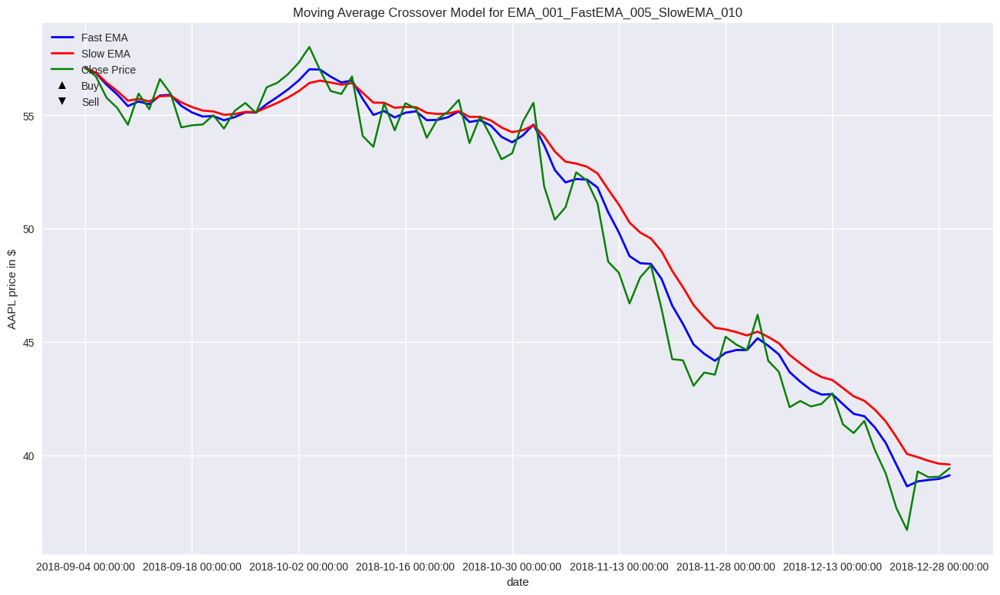

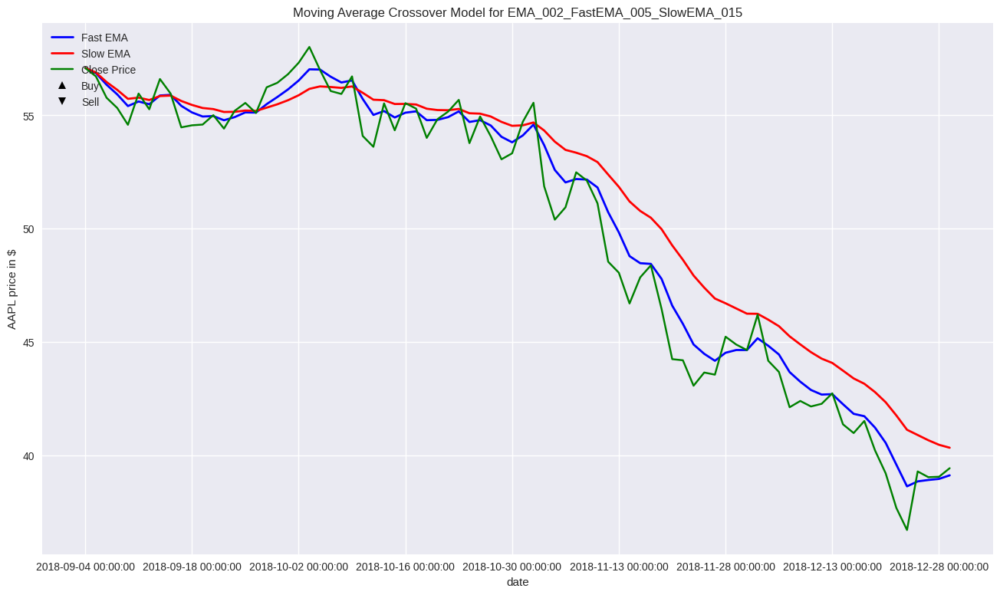

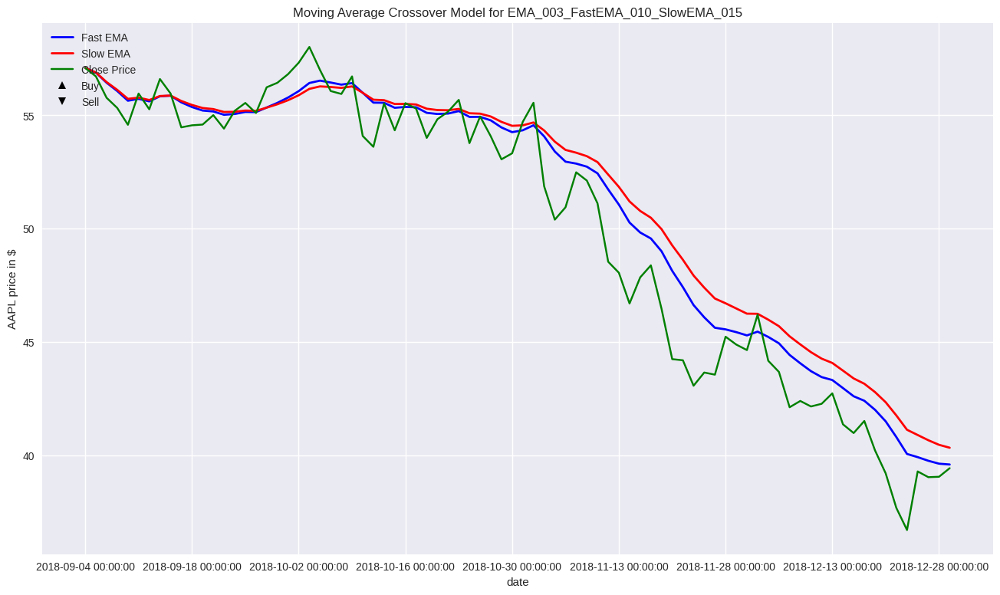

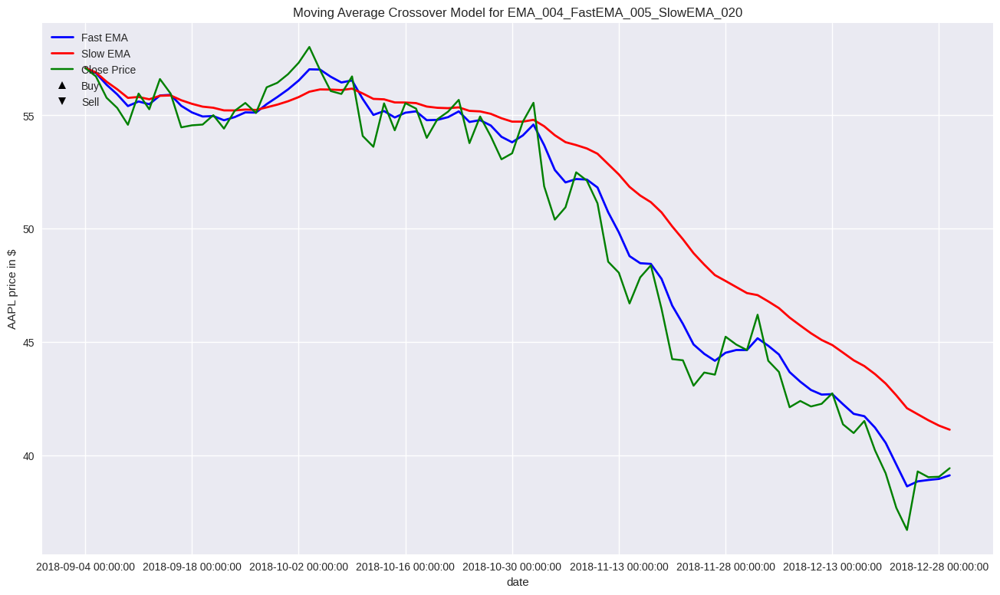

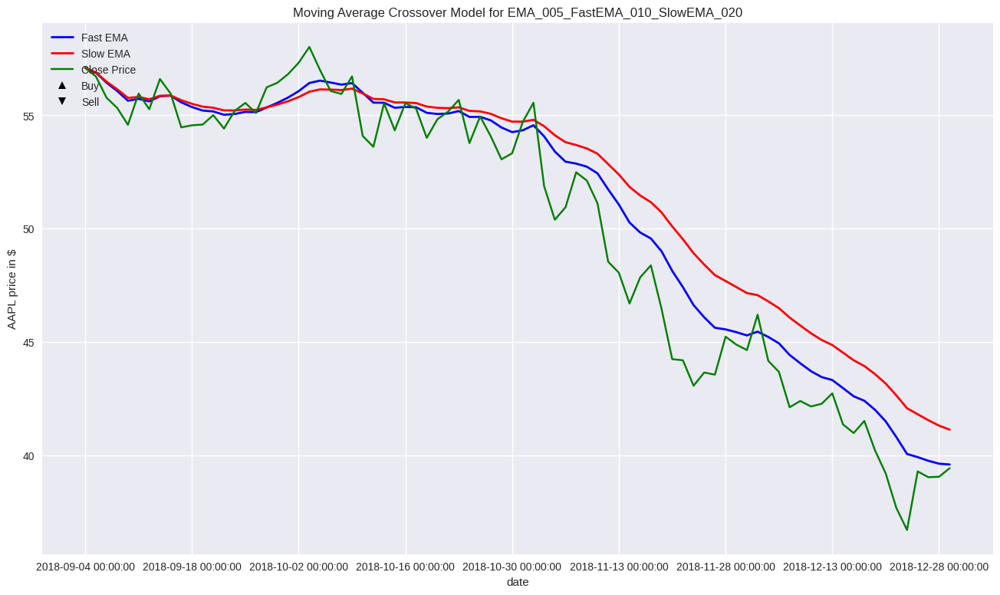

...

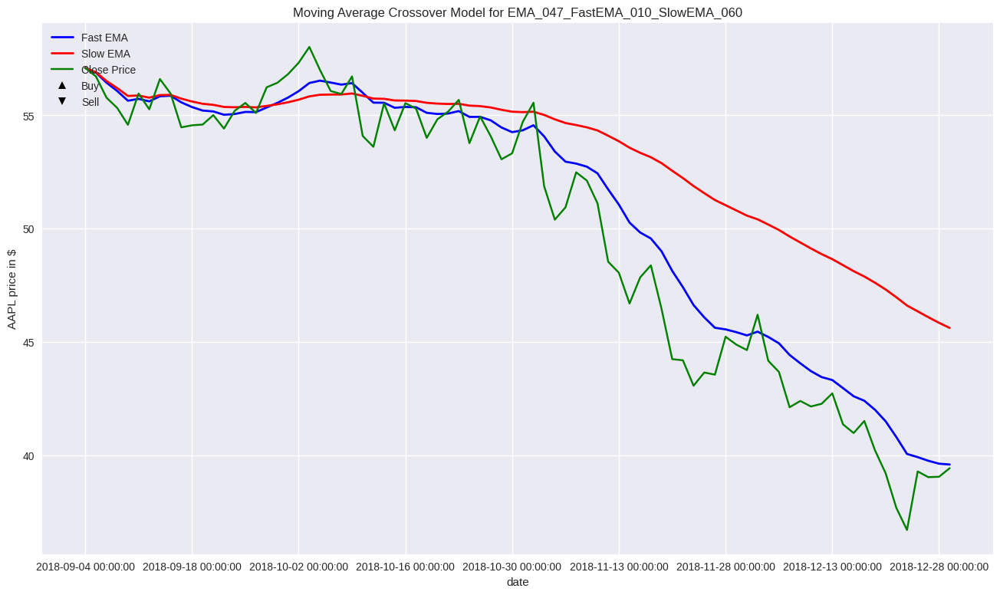

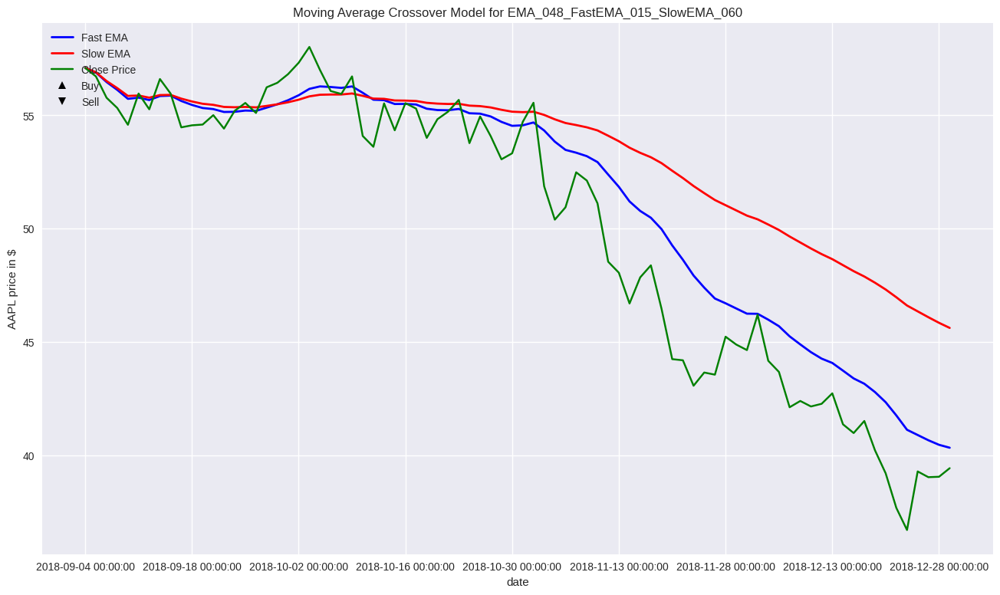

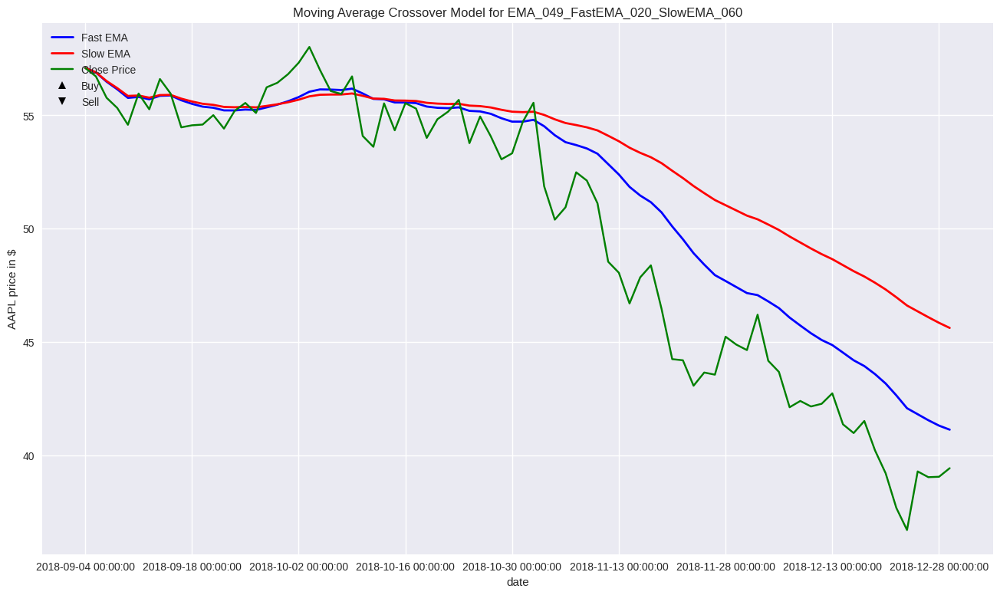

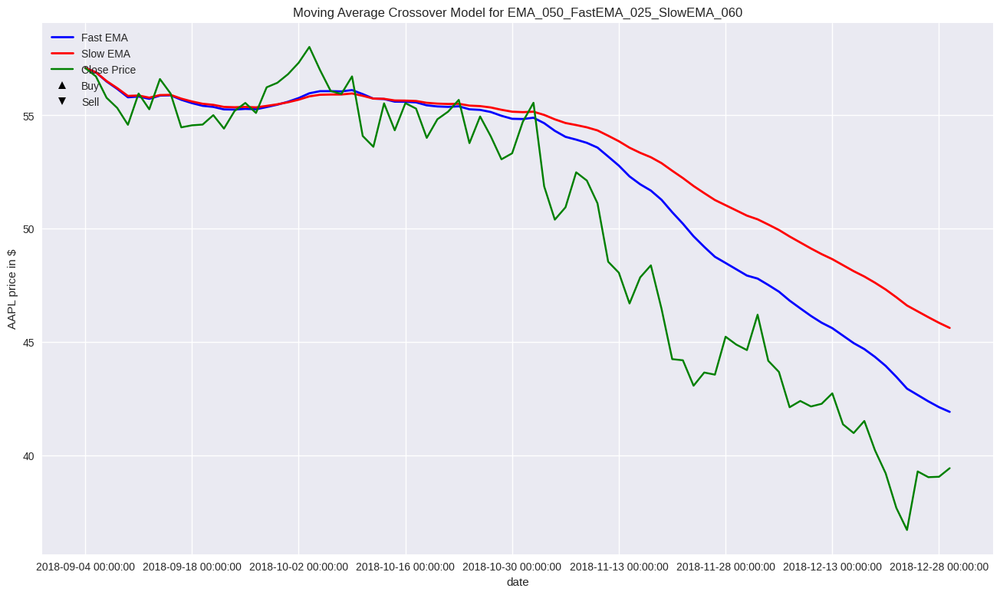

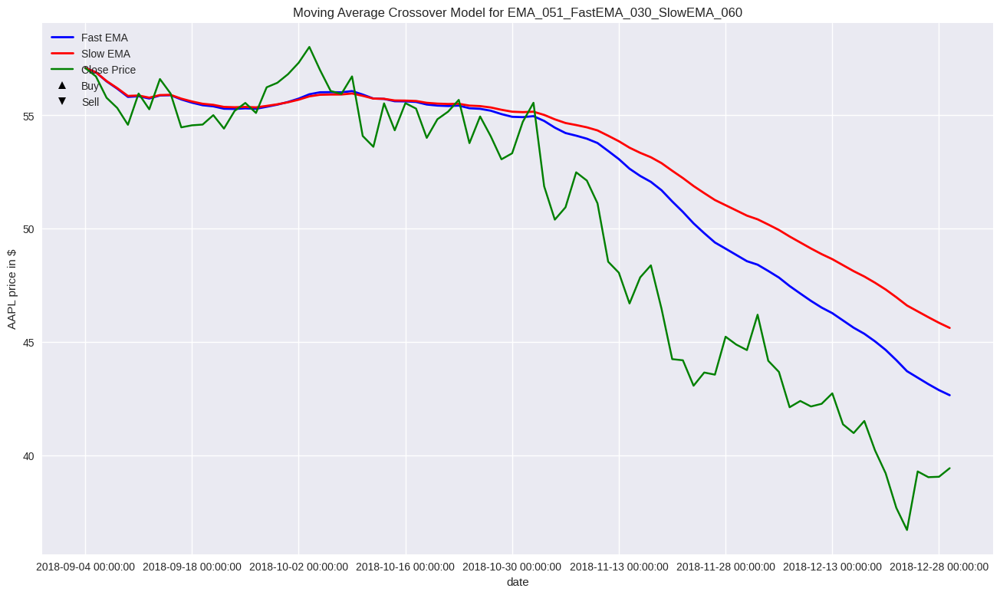

In [ ]:
if verbose_graphs:
    for tag in ema_model_collection:
        draw_model_graphs(tag, ema_model_collection[tag], stock_symbol, 'fast_ema', 'slow_ema')

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Plotting function
def draw_model_graphs(model_name, trade_model, stock_symbol, fast_ma_curve='fast_sma', slow_ma_curve='slow_sma'):
    graph_data = trade_model.copy()
    title_string = f"Moving Average Crossover Model for {model_name}"
    ylabel = f"{stock_symbol} price in $"

    fig, ax1 = plt.subplots(figsize=(16, 9))
    ax1.set_ylabel(ylabel)
    ax1.set_title(title_string)

    # Plot the moving averages and close price
    graph_data[fast_ma_curve].plot(ax=ax1, color='b', lw=2, label='Fast SMA')
    graph_data[slow_ma_curve].plot(ax=ax1, color='r', lw=2, label='Slow SMA')
    graph_data['close_price'].plot(ax=ax1, color='g', label='Close Price')

    # Plot buy and sell signals
    ax1.plot(graph_data.loc[graph_data.entry_exit == 1].index,
             graph_data.loc[graph_data.entry_exit == 1, 'close_price'],
             '^', markersize=7, color='k', label='Buy')
    ax1.plot(graph_data.loc[graph_data.entry_exit == -1].index,
             graph_data.loc[graph_data.entry_exit == -1, 'close_price'],
             'v', markersize=7, color='k', label='Sell')

    # Add legend and show plot
    ax1.legend(loc='upper left')
    plt.show()

# Example usage
# draw_model_graphs('Example Model', df, 'AAPL')

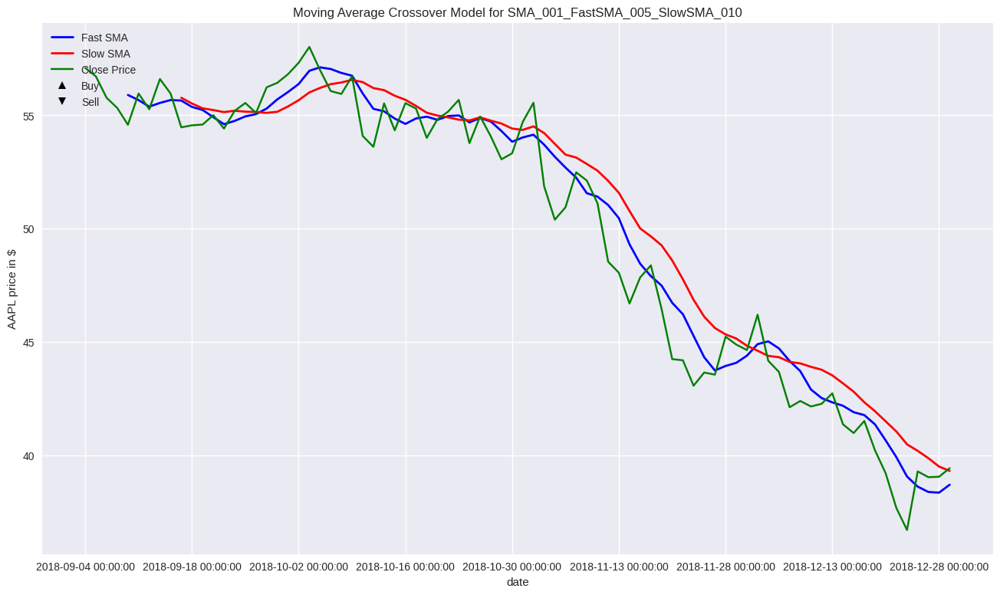

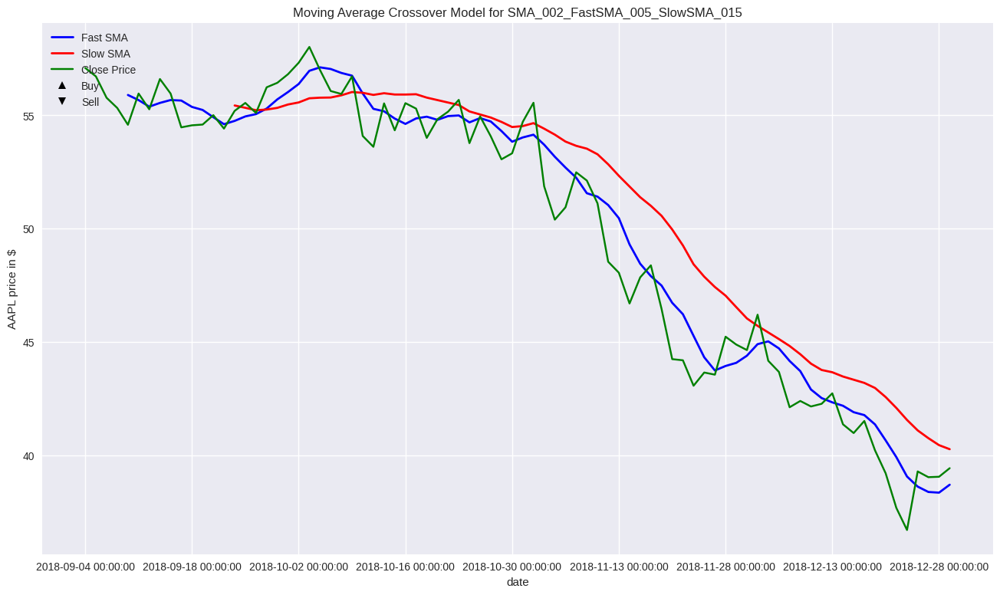

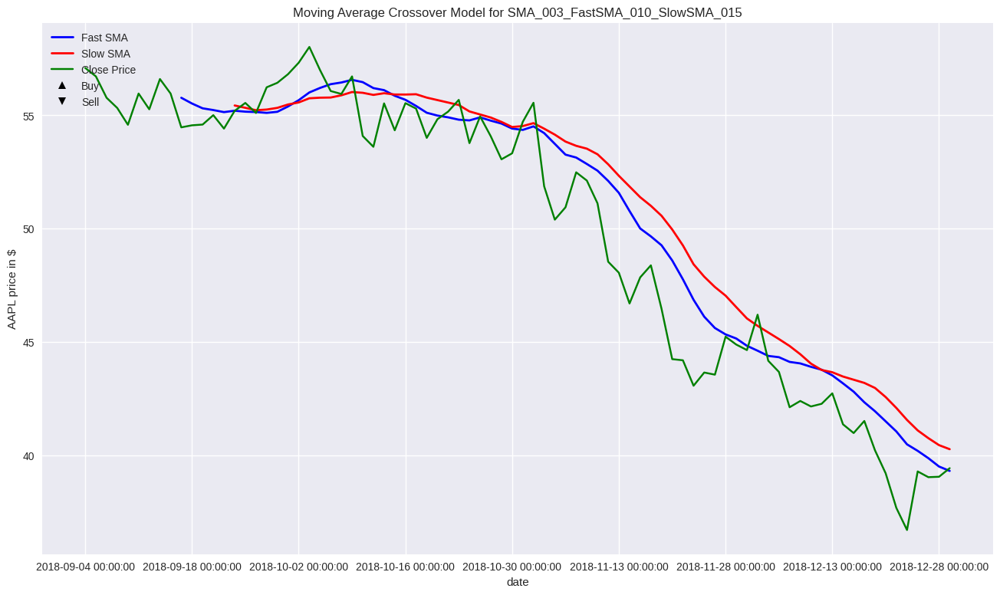

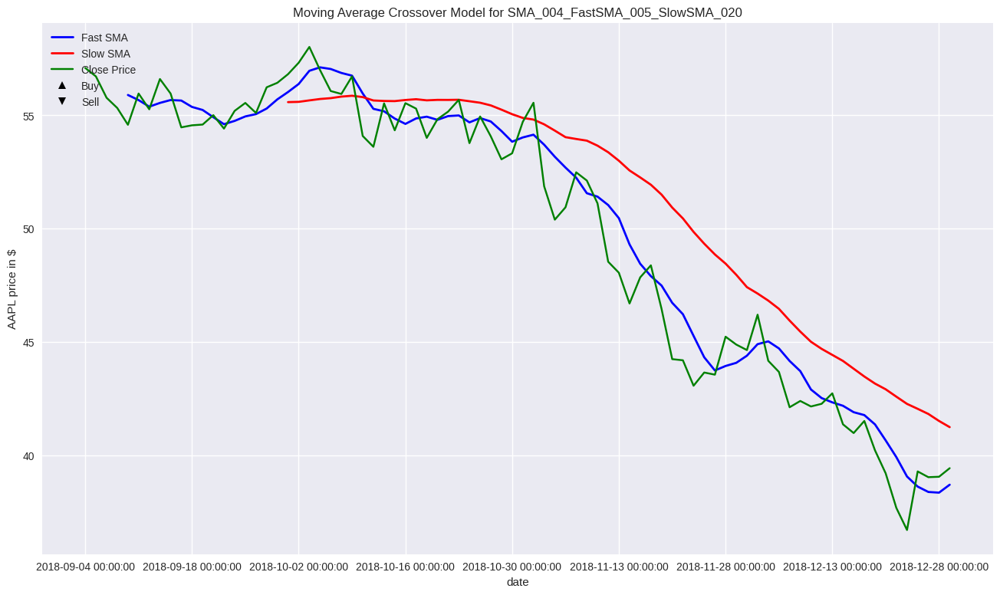

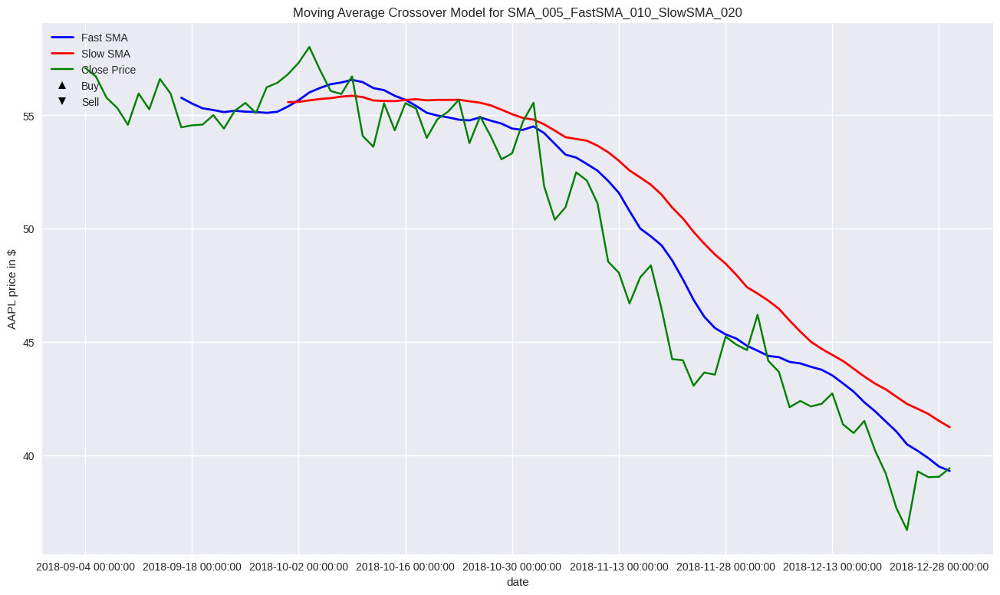

...

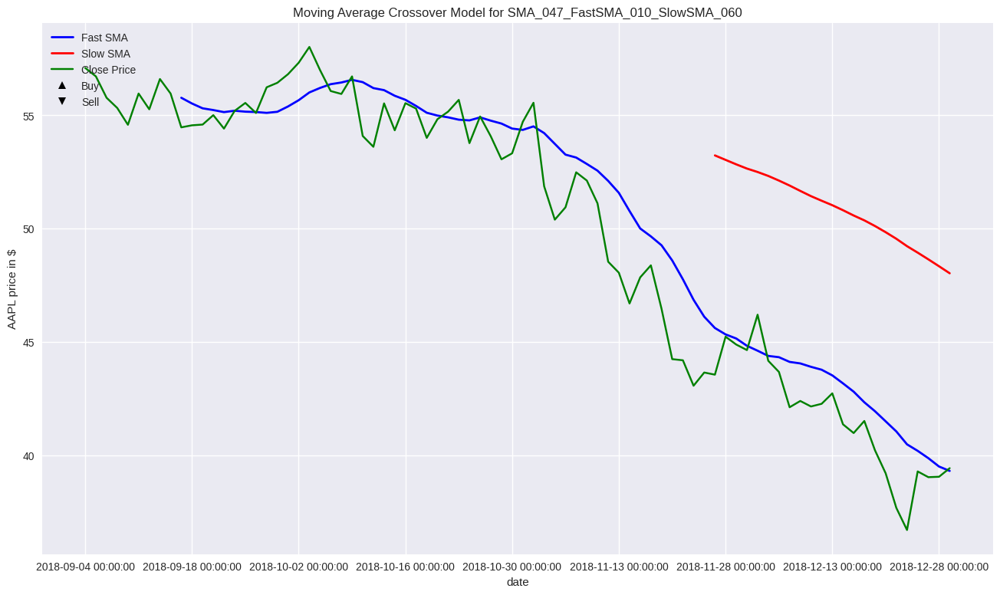

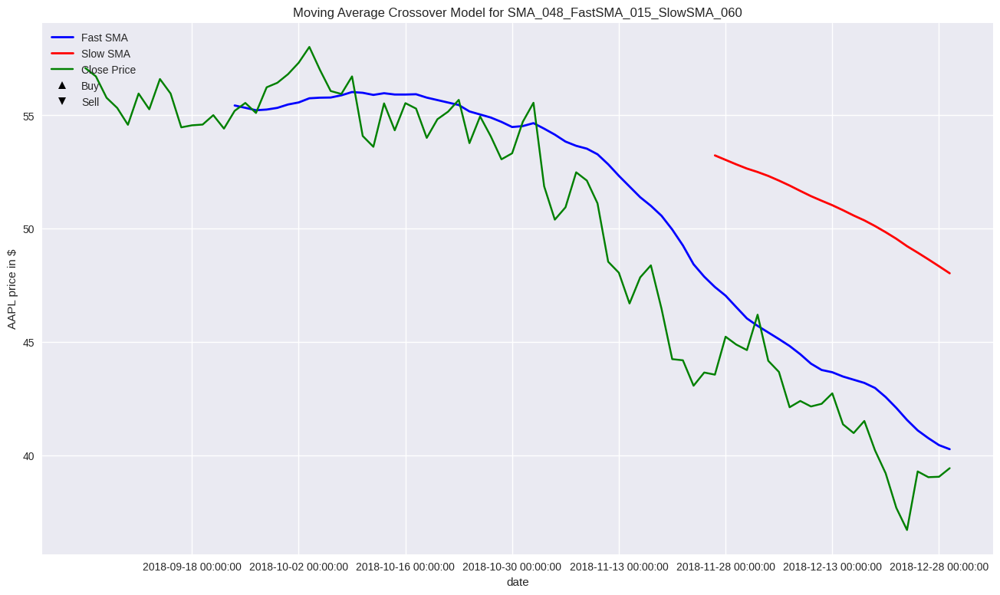

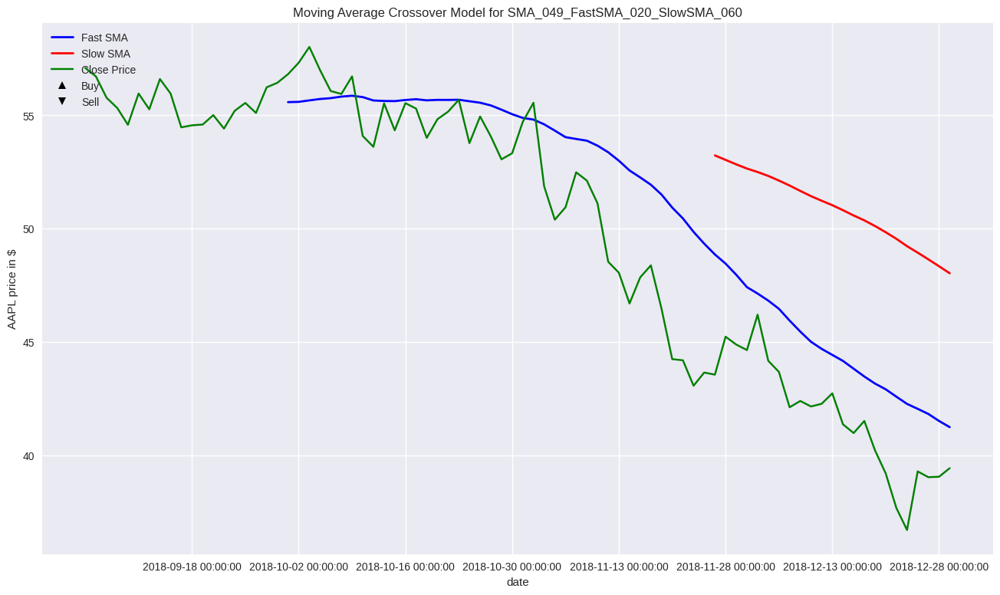

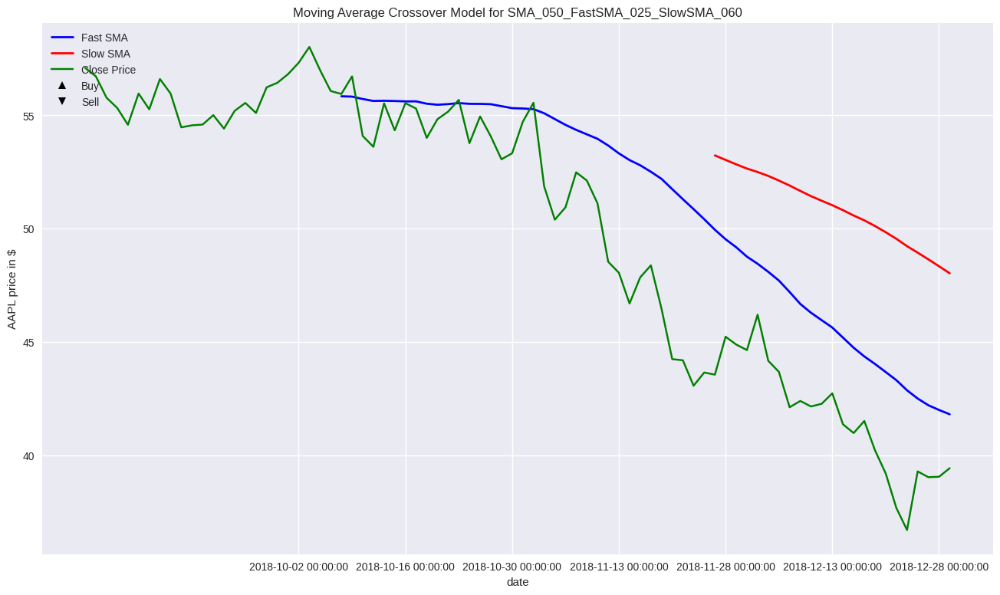

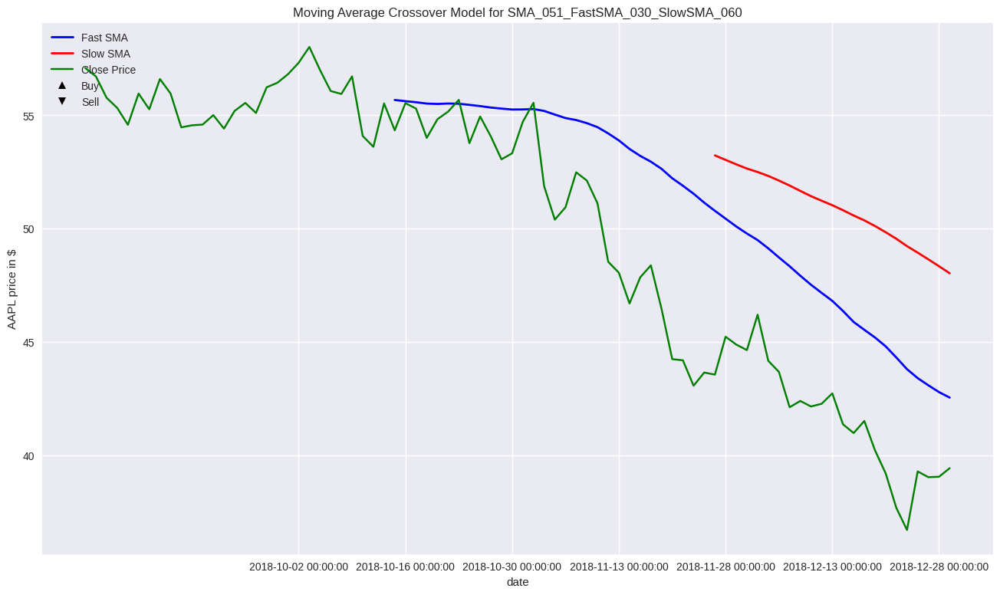

In [ ]:
if verbose_graphs:
    for tag in sma_model_collection:
        draw_model_graphs(tag, sma_model_collection[tag], 'fast_sma', 'slow_sma')

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Plotting function
def draw_model_graphs(model_name, trade_model, stock_symbol, fast_ma_curve='fast_ema', slow_ma_curve='slow_sma'):
    graph_data = trade_model.copy()
    title_string = f"Moving Average Crossover Model for {model_name}"
    ylabel = f"{stock_symbol} price in $"

    fig, ax1 = plt.subplots(figsize=(16, 9))
    ax1.set_ylabel(ylabel)
    ax1.set_title(title_string)

    # Plot the moving averages and close price
    graph_data[fast_ma_curve].plot(ax=ax1, color='b', lw=2, label='Fast EMA')
    graph_data[slow_ma_curve].plot(ax=ax1, color='r', lw=2, label='Slow SMA')
    graph_data['close_price'].plot(ax=ax1, color='g', label='Close Price')

    # Plot buy and sell signals
    ax1.plot(graph_data.loc[graph_data.entry_exit == 1].index,
             graph_data.loc[graph_data.entry_exit == 1, 'close_price'],
             '^', markersize=7, color='k', label='Buy')
    ax1.plot(graph_data.loc[graph_data.entry_exit == -1].index,
             graph_data.loc[graph_data.entry_exit == -1, 'close_price'],
             'v', markersize=7, color='k', label='Sell')

    # Add legend and show plot
    ax1.legend(loc='upper left')
    plt.show()

# Example usage
# draw_model_graphs('Example Model', df, 'AAPL')

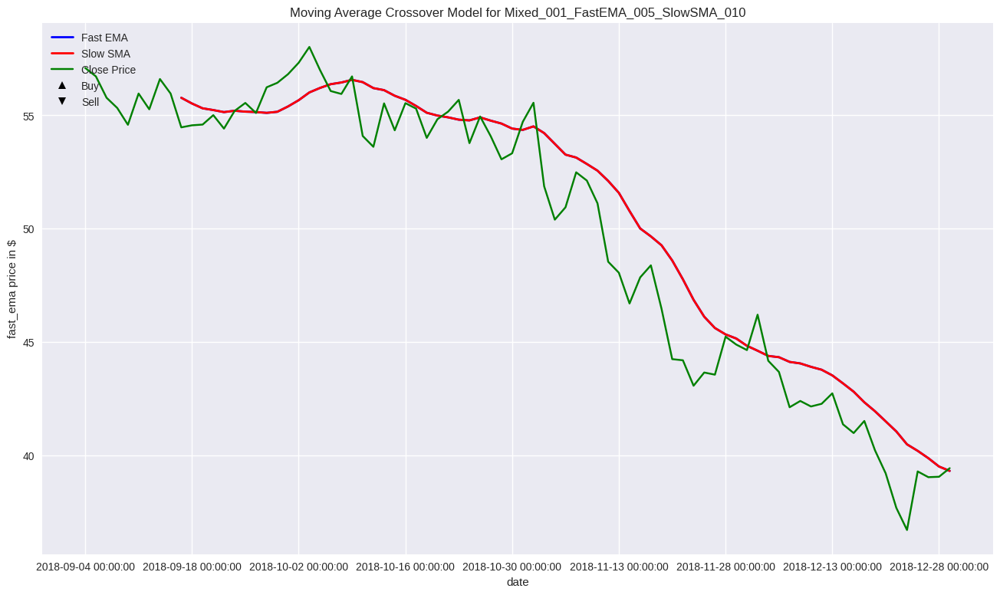

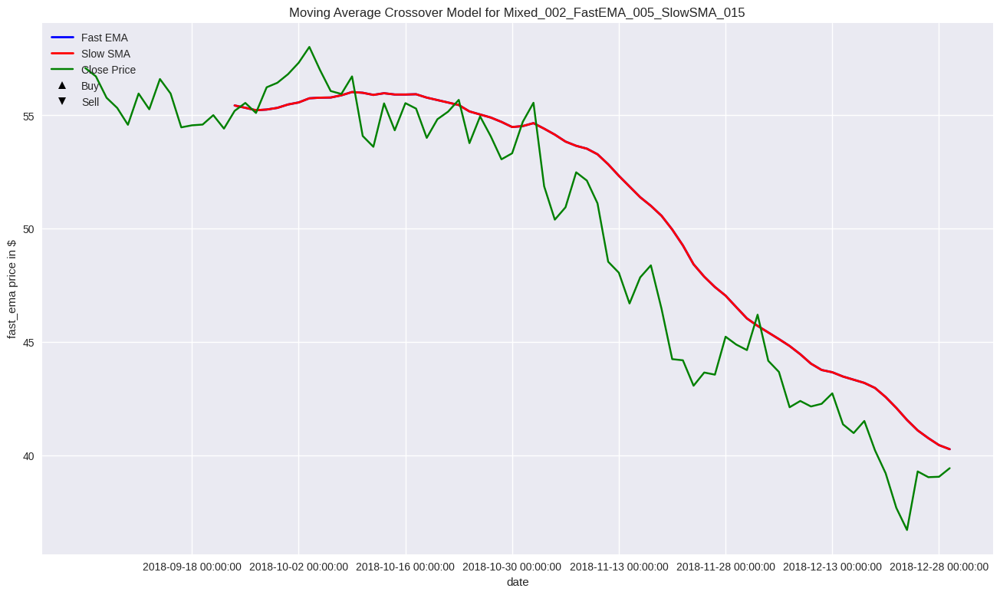

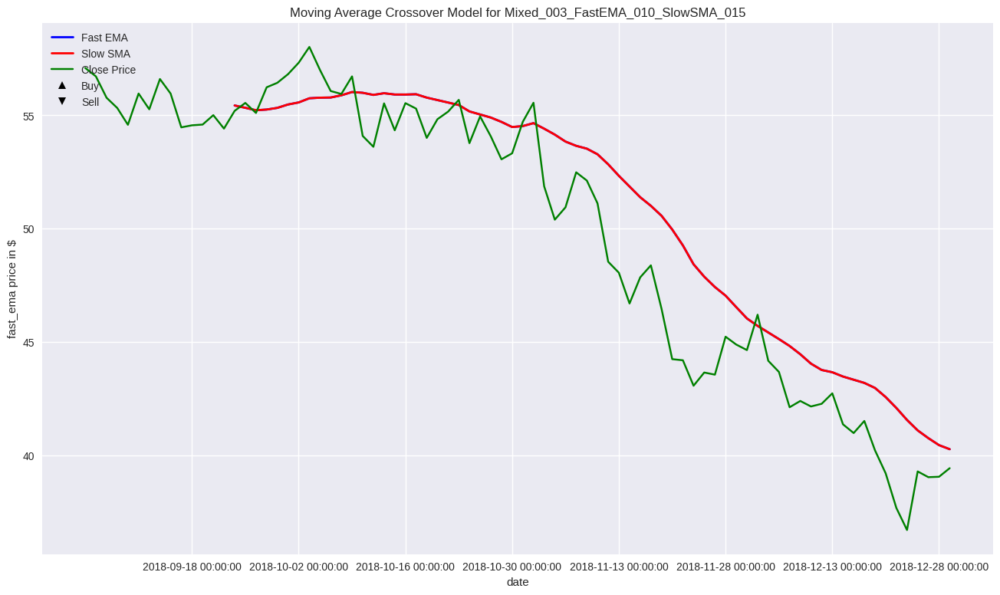

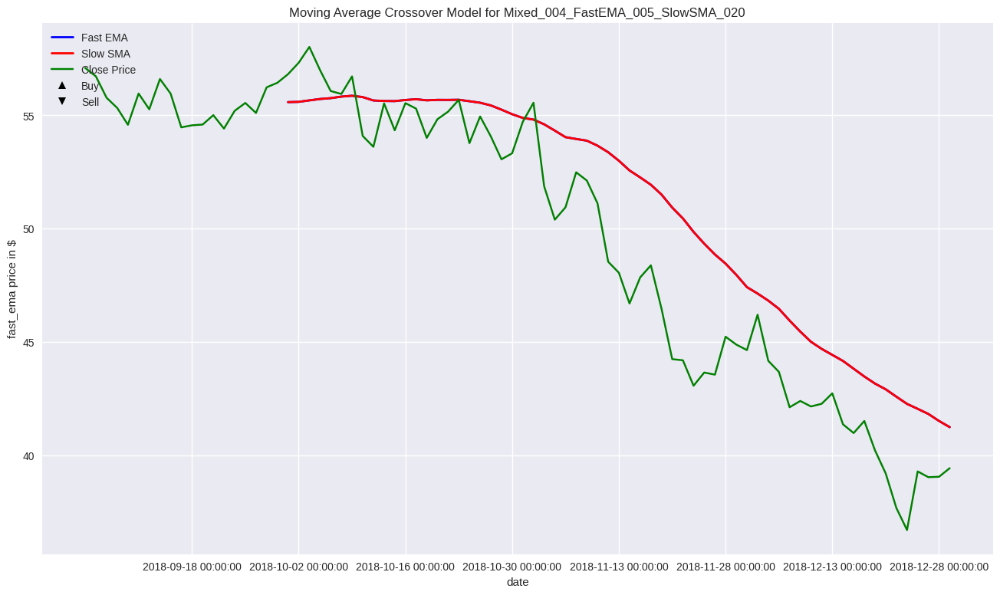

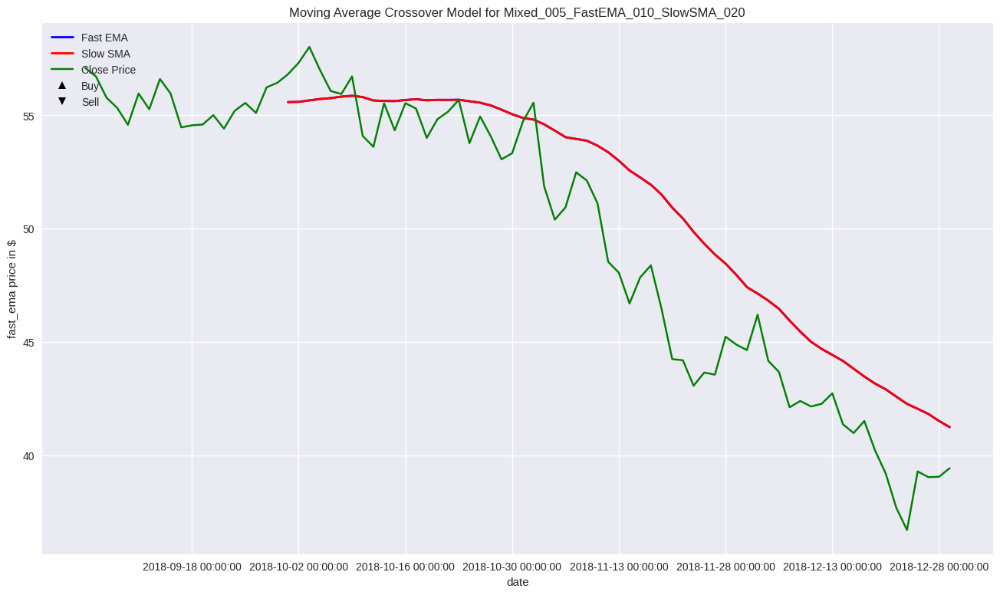

...

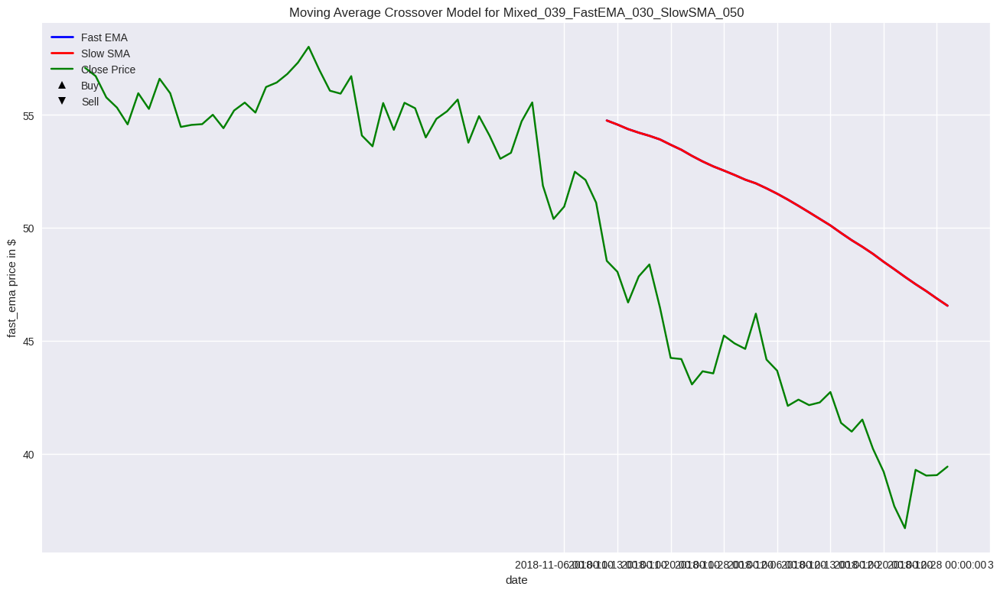

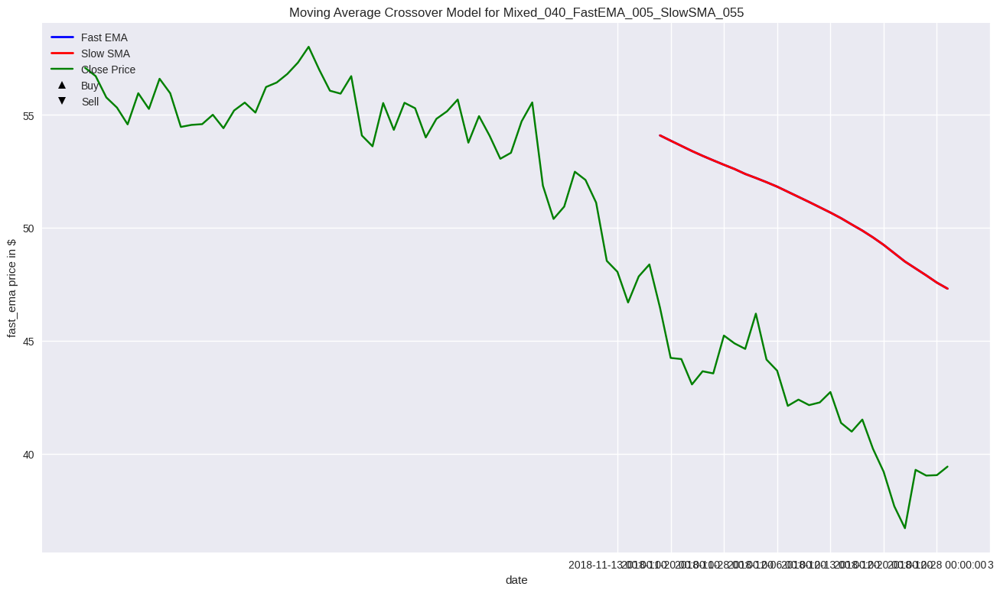

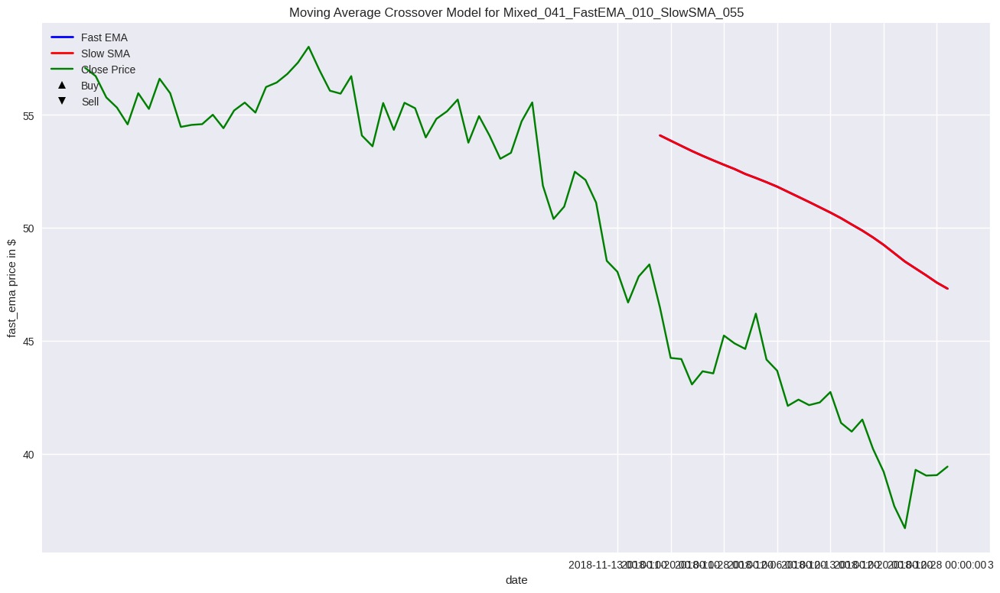

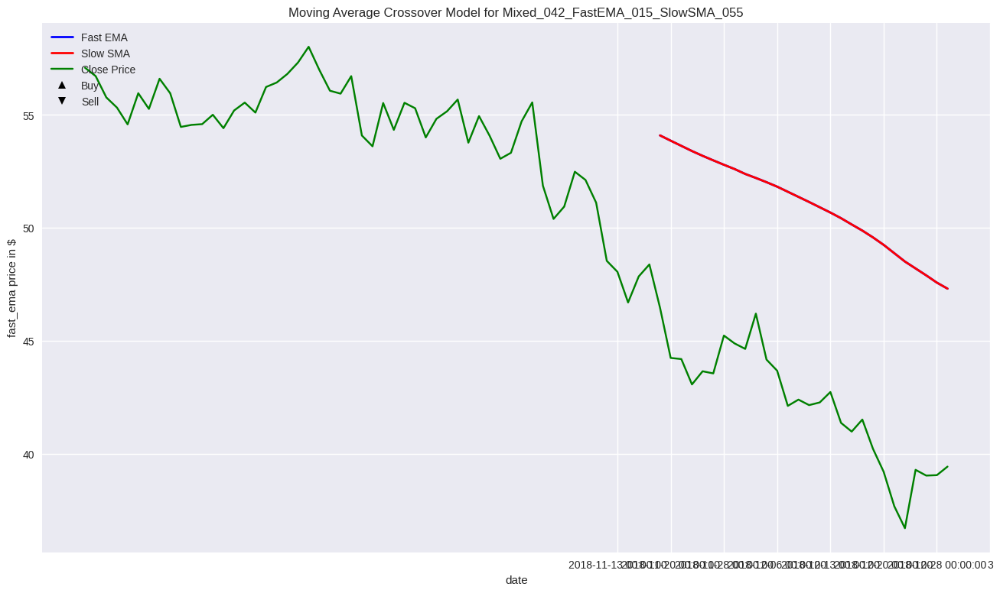

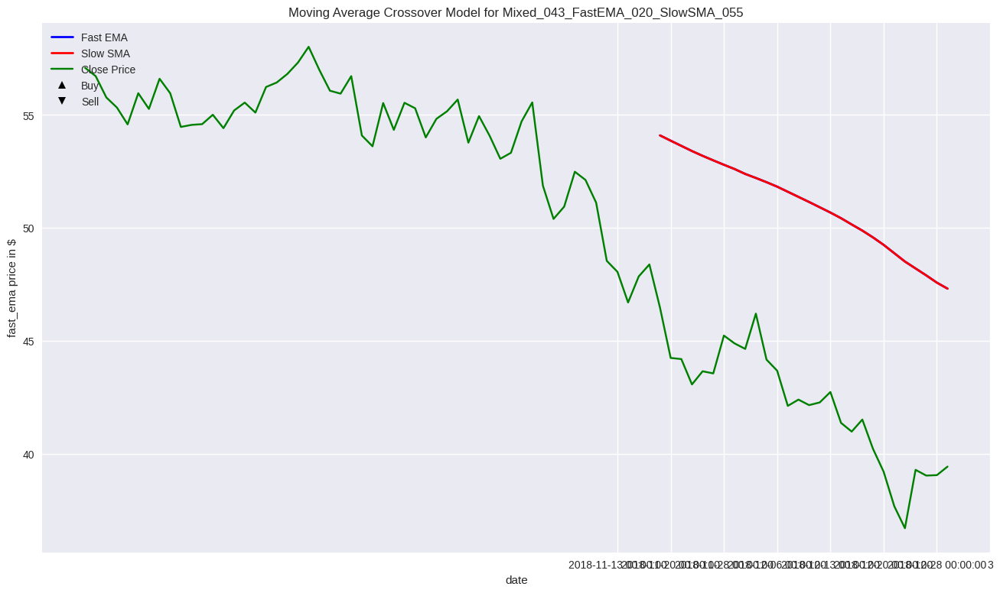

In [ ]:
if verbose_graphs:
    for tag in fast_ema_slow_sma_models:
        draw_model_graphs(tag, fast_ema_slow_sma_models[tag], 'fast_ema', 'slow_sma')

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Plotting function
def draw_model_graphs(model_name, trade_model, stock_symbol, fast_ma_curve='fast_sma', slow_ma_curve='slow_ema'):
    graph_data = trade_model.copy()
    title_string = f"Moving Average Crossover Model for {model_name}"
    ylabel = f"{stock_symbol} price in $"

    fig, ax1 = plt.subplots(figsize=(16, 9))
    ax1.set_ylabel(ylabel)
    ax1.set_title(title_string)

    # Plot the moving averages and close price
    graph_data[fast_ma_curve].plot(ax=ax1, color='b', lw=2, label='Fast SMA')
    graph_data[slow_ma_curve].plot(ax=ax1, color='r', lw=2, label='Slow EMA')
    graph_data['close_price'].plot(ax=ax1, color='g', label='Close Price')

    # Plot buy and sell signals
    ax1.plot(graph_data.loc[graph_data.entry_exit == 1].index,
             graph_data.loc[graph_data.entry_exit == 1, 'close_price'],
             '^', markersize=7, color='k', label='Buy')
    ax1.plot(graph_data.loc[graph_data.entry_exit == -1].index,
             graph_data.loc[graph_data.entry_exit == -1, 'close_price'],
             'v', markersize=7, color='k', label='Sell')

    # Add legend and show plot
    ax1.legend(loc='upper left')
    plt.show()

# Example usage
# draw_model_graphs('Example Model', df, 'AAPL')

In [ ]:
if verbose_graphs:
    for tag in fast_sma_slow_ema_models:
        draw_model_graphs(tag, fast_sma_slow_ema_models[tag], 'fast_sma', 'slow_ema')

## Task 4. Back-test Model

In [ ]:
def trading_portfolio_generation(initial_fund, trade_model):
    # Construct a portfolio to track the transactions and returns
    portfolio = pd.DataFrame(index=trade_model.index, columns=['trade_action', 'qty_onhand', 'cost_basis', 'sold_transaction', 'gain_loss', 'cash_onhand', 'position_value', 'total_position', 'accumu_return'])
    portfolio.iloc[0]['trade_action'] = 0
    portfolio.iloc[0]['qty_onhand'] = 0
    portfolio.iloc[0]['cost_basis'] = 0.00
    portfolio.iloc[0]['sold_transaction'] = 0.00
    portfolio.iloc[0]['gain_loss'] = 0.00
    portfolio.iloc[0]['cash_onhand'] = initial_capital
    portfolio.iloc[0]['position_value'] = 0.00
    portfolio.iloc[0]['total_position'] = initial_capital
    portfolio.iloc[0]['accumu_return'] = portfolio.iloc[0]['total_position'] - initial_fund
    recent_cost = 0

    # The conditional parameters below determine how the trading strategy will be carried out
    for i in range(1, len(portfolio)):
        if (trade_model.iloc[i]['entry_exit'] == 1) and (portfolio.iloc[i-1]['qty_onhand'] == 0):
            portfolio.iloc[i]['trade_action'] = 1
            portfolio.iloc[i]['qty_onhand'] = portfolio.iloc[i-1]['qty_onhand'] + portfolio.iloc[i]['trade_action']
            portfolio.iloc[i]['cost_basis'] = trade_model.iloc[i]['open_price'] * portfolio.iloc[i]['trade_action']
            portfolio.iloc[i]['sold_transaction'] = 0.00
            portfolio.iloc[i]['gain_loss'] = 0.00
            portfolio.iloc[i]['cash_onhand'] = portfolio.iloc[i-1]['cash_onhand'] - portfolio.iloc[i]['cost_basis']
            recent_cost = trade_model.iloc[i]['open_price'] * portfolio.iloc[i]['trade_action']
            if verbose_portfolios: print('BOUGHT QTY:', portfolio.iloc[i]['trade_action'], 'on', portfolio.index[i], 'at the price of', trade_model.iloc[i]['open_price'])
        elif (trade_model.iloc[i]['entry_exit'] == -1) and (portfolio.iloc[i-1]['qty_onhand'] > 0):
            portfolio.iloc[i]['trade_action'] = -1
            portfolio.iloc[i]['qty_onhand'] = portfolio.iloc[i-1]['qty_onhand'] + portfolio.iloc[i]['trade_action']
            portfolio.iloc[i]['cost_basis'] = 0.00
            portfolio.iloc[i]['sold_transaction'] = trade_model.iloc[i]['open_price'] * portfolio.iloc[i]['trade_action'] * -1
            portfolio.iloc[i]['gain_loss'] = (recent_cost + (trade_model.iloc[i]['open_price'] * portfolio.iloc[i]['trade_action'])) * -1
            portfolio.iloc[i]['cash_onhand'] = portfolio.iloc[i-1]['cash_onhand'] + portfolio.iloc[i]['sold_transaction']
            recent_cost = 0.00
            if verbose_portfolios: print('SOLD QTY:', portfolio.iloc[i]['trade_action'], 'on', portfolio.index[i], 'at the price of', trade_model.iloc[i]['open_price'])
        else:
            portfolio.iloc[i]['trade_action'] = 0
            portfolio.iloc[i]['qty_onhand'] = portfolio.iloc[i-1]['qty_onhand']
            portfolio.iloc[i]['cost_basis'] = portfolio.iloc[i-1]['cost_basis']
            portfolio.iloc[i]['sold_transaction'] = 0.00
            portfolio.iloc[i]['gain_loss'] = 0.00
            portfolio.iloc[i]['cash_onhand'] = portfolio.iloc[i-1]['cash_onhand']
        portfolio.iloc[i]['position_value'] = trade_model.iloc[i]['close_price'] * portfolio.iloc[i]['qty_onhand']
        portfolio.iloc[i]['total_position'] = portfolio.iloc[i]['cash_onhand'] + portfolio.iloc[i]['position_value']
        portfolio.iloc[i]['accumu_return'] = portfolio.iloc[i]['total_position'] - initial_fund

    return portfolio

In [ ]:
def generate_portfolio_and_performance(model_collection):
    # Initialize a dictionary for tracking portfolios for all models
    portfolio_collection = {}
    # Initialize a dataframe for reporting model performance summary
    performance_summary = pd.DataFrame(columns=['model_name','return_value','return_percent'])

    for model_name in model_collection:
        if verbose_portfolios: print('Processing portfolio for model:', model_name)
        portfolio_collection[model_name] = trading_portfolio_generation(initial_capital, model_collection[model_name])
        trade_transactions = portfolio_collection[model_name][portfolio_collection[model_name].trade_action != 0]
        if verbose_portfolios: print(trade_transactions)
        if verbose_portfolios: print('Accumulated profit/loss for one share of stock with initial capital of $%.0f at the end of modeling period: $%.2f' % (initial_capital, portfolio_collection[model_name].accumu_return[-1]))
        if initial_capital != 0:
            return_percentage = portfolio_collection[model_name].accumu_return[-1] / initial_capital * 100
            if verbose_portfolios: print('Accumulated return percentage based on the initial capital investment: %.2f%%' % return_percentage)
        else:
            return_percentage = None
        if trade_transactions.iloc[-1]['trade_action'] == 1:
            if verbose_portfolios: print('The current status of the model is:', 'Holding a position since', trade_transactions.index.tolist()[-1], '\n')
        else:
            if verbose_portfolios: print('The current status of the model is:', 'Waiting to enter since', trade_transactions.index.tolist()[-1], '\n')
        performance_summary = performance_summary.append({'model_name': model_name, 'return_value': portfolio_collection[model_name].accumu_return[-1], 'return_percent': return_percentage}, ignore_index=True)
    performance_summary.sort_values(by=['return_value'], inplace=True, ascending=False)
    return portfolio_collection, performance_summary

In [ ]:
ema_portfolio_collection, ema_performance_summary = generate_portfolio_and_performance(ema_model_collection)
print(len(ema_portfolio_collection), 'trading transaction portfolios generated.')
print(len(ema_performance_summary), 'profit/loss performance summaries generated.')

51 trading transaction portfolios generated.
51 profit/loss performance summaries generated.


In [ ]:
sma_portfolio_collection, sma_performance_summary = generate_portfolio_and_performance(sma_model_collection)
print(len(sma_portfolio_collection), 'trading transaction portfolios generated.')
print(len(sma_performance_summary), 'profit/loss performance summaries generated.')

51 trading transaction portfolios generated.
51 profit/loss performance summaries generated.


In [ ]:
fast_ema_slow_sma_portfolios, fast_ema_slow_sma_performance = generate_portfolio_and_performance(fast_ema_slow_sma_models)
print(len(fast_ema_slow_sma_portfolios), 'trading transaction portfolios generated.')
print(len(fast_ema_slow_sma_performance), 'profit/loss performance summaries generated.')

51 trading transaction portfolios generated.
51 profit/loss performance summaries generated.


In [ ]:
fast_sma_slow_ema_portfolios, fast_sma_slow_ema_performance = generate_portfolio_and_performance(fast_sma_slow_ema_models)
print(len(fast_sma_slow_ema_portfolios), 'trading transaction portfolios generated.')
print(len(fast_sma_slow_ema_performance), 'profit/loss performance summaries generated.')

51 trading transaction portfolios generated.
51 profit/loss performance summaries generated.


In [ ]:
# Display the top models from EMA-only performance summary
ema_performance_summary.head()

,model_name,return_value,return_percent
3,EMA_004_FastEMA_005_SlowEMA_020,280.73,None
6,EMA_007_FastEMA_005_SlowEMA_025,280.64,None
2,EMA_003_FastEMA_010_SlowEMA_015,280.17,None
10,EMA_011_FastEMA_005_SlowEMA_030,275.35,None
4,EMA_005_FastEMA_010_SlowEMA_020,267.09,None


In [ ]:
# Display the top models from SMA-only performance summary
sma_performance_summary.head()

,model_name,return_value,return_percent
4,SMA_005_FastSMA_010_SlowSMA_020,284.110,None
15,SMA_016_FastSMA_005_SlowSMA_035,278.765,None
10,SMA_011_FastSMA_005_SlowSMA_030,273.420,None
5,SMA_006_FastSMA_015_SlowSMA_020,273.030,None
29,SMA_030_FastSMA_015_SlowSMA_045,271.850,None


In [ ]:
# Display the top models from Fast EMA/Slow SMA performance summary
fast_ema_slow_sma_performance.head()

,model_name,return_value,return_percent
10,Mixed_011_FastEMA_005_SlowSMA_030,289.28,None
8,Mixed_009_FastEMA_015_SlowSMA_025,288.41,None
20,Mixed_021_FastEMA_030_SlowSMA_035,288.37,None
6,Mixed_007_FastEMA_005_SlowSMA_025,287.71,None
7,Mixed_008_FastEMA_010_SlowSMA_025,286.73,None


In [ ]:
# Display the top models from Fast SMA/Slow EMA performance summary
fast_sma_slow_ema_performance.head()

,model_name,return_value,return_percent
34,Mixed_035_FastSMA_010_SlowEMA_050,283.32,None
28,Mixed_029_FastSMA_010_SlowEMA_045,276.72,None
46,Mixed_047_FastSMA_010_SlowEMA_060,274.42,None
40,Mixed_041_FastSMA_010_SlowEMA_055,273.47,None
6,Mixed_007_FastSMA_005_SlowEMA_025,271.54,None


In [ ]:
# Display the entry/exit signals and transactions from the top model
def display_signals_transactions(model_name, portfolio_collection, model_collection):
    cols_to_display = ['open_price','close_price','fast_ema','slow_ema','fast_sma','slow_sma','trade_signal','signal_change','entry_exit']
    print('The transactions from the top model %s:' % model_name)
    print(portfolio_collection[model_name][portfolio_collection[model_name].trade_action != 0])
    print()
    print('The trading signal changes from the top model %s:' % model_name)
    print(model_collection[model_name][(model_collection[model_name].signal_change != 0) | (model_collection[model_name].entry_exit != 0)][cols_to_display])

The transactions from the top model Mixed_011_FastEMA_005_SlowSMA_030:
           trade_action qty_onhand cost_basis sold_transaction gain_loss cash_onhand position_value total_position accumu_return
date                                                                                                                            
2019-01-29            1          1     156.25                0         0     -156.25         154.68          -1.57         -1.57
2019-05-14           -1          0          0           186.41     30.16       30.16              0          30.16         30.16
2019-06-13            1          1      194.7                0         0     -164.54         194.15          29.61         29.61
2019-08-06           -1          0          0           196.31      1.61       31.77              0          31.77         31.77
2019-08-20            1          1     210.88                0         0     -179.11         210.36          31.25         31.25
2020-02-25           -1   

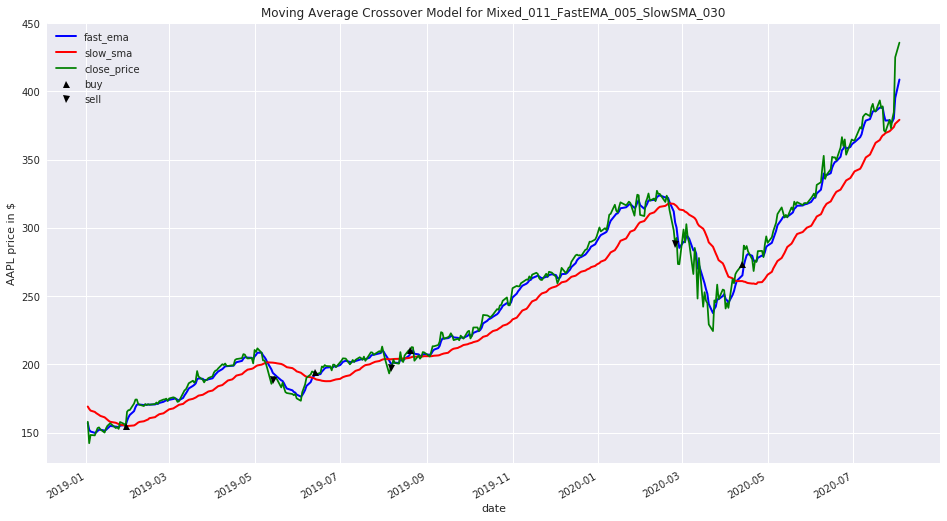

In [ ]:
# Display the details for the top model
return_list = [ema_performance_summary.iloc[0]['return_value'], sma_performance_summary.iloc[0]['return_value'],
               fast_ema_slow_sma_performance.iloc[0]['return_value'], fast_sma_slow_ema_performance.iloc[0]['return_value']]
performance_list = [ema_performance_summary, sma_performance_summary, fast_ema_slow_sma_performance, fast_sma_slow_ema_performance]
portfolio_list = [ema_portfolio_collection, sma_portfolio_collection, fast_ema_slow_sma_portfolios, fast_sma_slow_ema_portfolios]
model_list = [ema_model_collection, sma_model_collection, fast_ema_slow_sma_models, fast_sma_slow_ema_models]
fast_ma_list = ['fast_ema', 'fast_sma', 'fast_ema', 'fast_sma']
slow_ma_list = ['slow_ema', 'slow_sma', 'slow_sma', 'slow_ema']
top_model_return = max(return_list)
top_model_index = return_list.index(top_model_return)
top_model_name = performance_list[top_model_index].iloc[0]['model_name']
display_signals_transactions(top_model_name, portfolio_list[top_model_index], model_list[top_model_index])
print()
draw_model_graphs(top_model_name, model_list[top_model_index][top_model_name], fast_ma_list[top_model_index], slow_ma_list[top_model_index])

## Task 5. Evaluate Performance

In [ ]:
print('The best model found is:', top_model_name)
print('The best profit/loss for the investing period is: $%.2f' % top_model_return)
if initial_capital != 0:
    print('The best return percentage for initial capital is: %.2f%%' % (top_model_return / initial_capital * 100))

The best model found is: Mixed_011_FastEMA_005_SlowSMA_030
The best profit/loss for the investing period is: $289.28


In [ ]:
# Calculate the stock's performance for a long-only model
model_template = model_template[model_start_date:model_end_date]
print('The performance of the long-only model from day one is: $%.2f' %(model_template.iloc[-1]['close_price'] - model_template.iloc[0]['open_price']))

The performance of the long-only model from day one is: $280.86


In [ ]:
print ('Total time for the script:',(datetime.now() - startTimeScript))

Total time for the script: 0:08:53.198656
